# CHICAGO CRASHES ANALYSIS

In this project, Chicago crashes dataset will be analysed through steps:
- Data Extraction
- Data Cleanning and Transformation
- Data Visualisation

## Data Extraction

Fetching data from the Chicago Data Portal using the Socrata API and then converting the retrieved data into a Pandas DataFrame
It's essentially the process of extracting data from a remote dataset and preparing it for further analysis or manipulation.

In [55]:
import pandas as pd
from sodapy import Socrata

client = Socrata("data.cityofchicago.org", None)
results = client.get("85ca-t3if", limit=500000) #Extract 500000 lines from the source

# Convert to pandas DataFrame
df = pd.DataFrame.from_records(results)
df.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 49 columns):
 #   Column                         Non-Null Count   Dtype 
---  ------                         --------------   ----- 
 0   crash_record_id                500000 non-null  object
 1   crash_date_est_i               37456 non-null   object
 2   crash_date                     500000 non-null  object
 3   posted_speed_limit             500000 non-null  object
 4   traffic_control_device         500000 non-null  object
 5   device_condition               500000 non-null  object
 6   weather_condition              500000 non-null  object
 7   lighting_condition             500000 non-null  object
 8   first_crash_type               500000 non-null  object
 9   trafficway_type                500000 non-null  object
 10  alignment                      500000 non-null  object
 11  roadway_surface_cond           500000 non-null  object
 12  road_defect                    500000 non-nu

## Data Cleaning and Transformation

In [56]:
#Show all the columns
print(df.columns.tolist())

['crash_record_id', 'crash_date_est_i', 'crash_date', 'posted_speed_limit', 'traffic_control_device', 'device_condition', 'weather_condition', 'lighting_condition', 'first_crash_type', 'trafficway_type', 'alignment', 'roadway_surface_cond', 'road_defect', 'report_type', 'crash_type', 'damage', 'date_police_notified', 'prim_contributory_cause', 'sec_contributory_cause', 'street_no', 'street_direction', 'street_name', 'beat_of_occurrence', 'num_units', 'most_severe_injury', 'injuries_total', 'injuries_fatal', 'injuries_incapacitating', 'injuries_non_incapacitating', 'injuries_reported_not_evident', 'injuries_no_indication', 'injuries_unknown', 'crash_hour', 'crash_day_of_week', 'crash_month', 'latitude', 'longitude', 'location', ':@computed_region_rpca_8um6', 'hit_and_run_i', 'intersection_related_i', 'statements_taken_i', 'photos_taken_i', 'private_property_i', 'work_zone_i', 'work_zone_type', 'workers_present_i', 'dooring_i', 'lane_cnt']


In [57]:
#Drop all the unnecessary columns
df = df.drop(['crash_record_id','crash_date_est_i','alignment','sec_contributory_cause','beat_of_occurrence','num_units','injuries_incapacitating','injuries_non_incapacitating','injuries_reported_not_evident','injuries_no_indication','injuries_unknown',':@computed_region_rpca_8um6','statements_taken_i','photos_taken_i','dooring_i'], axis = 1)
# df = df.dropna(subset=['location','street'])

In [58]:
#Check the crash_date column value
df['crash_date'][0:10]

0    2024-01-23T02:02:00.000
1    2024-01-23T00:53:00.000
2    2024-01-23T00:45:00.000
3    2024-01-23T00:30:00.000
4    2024-01-23T00:25:00.000
5    2024-01-23T00:05:00.000
6    2024-01-23T00:04:00.000
7    2024-01-22T23:49:00.000
8    2024-01-22T23:43:00.000
9    2024-01-22T23:13:00.000
Name: crash_date, dtype: object

In [59]:
#Split the crash_date column to crash_date and crash_time 
df[['crash_date', 'crash_time']] = df['crash_date'].str.split('T',n = 1, expand=True)
df

,crash_date,posted_speed_limit,traffic_control_device,device_condition,weather_condition,lighting_condition,first_crash_type,trafficway_type,roadway_surface_cond,road_defect,...,longitude,location,hit_and_run_i,intersection_related_i,private_property_i,work_zone_i,work_zone_type,workers_present_i,lane_cnt,crash_time
0,2024-01-23,30,NO CONTROLS,UNKNOWN,RAIN,"DARKNESS, LIGHTED ROAD",PARKED MOTOR VEHICLE,ONE-WAY,WET,UNKNOWN,...,-87.753839617,"{'type': 'Point', 'coordinates': [-87.75383961...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,02:02:00.000
1,2024-01-23,15,NO CONTROLS,NO CONTROLS,FREEZING RAIN/DRIZZLE,"DARKNESS, LIGHTED ROAD",PEDESTRIAN,NOT DIVIDED,ICE,NO DEFECTS,...,-87.550036403,"{'type': 'Point', 'coordinates': [-87.55003640...",Y,NaN,NaN,NaN,NaN,NaN,NaN,00:53:00.000
2,2024-01-23,30,NO CONTROLS,NO CONTROLS,FREEZING RAIN/DRIZZLE,"DARKNESS, LIGHTED ROAD",PARKED MOTOR VEHICLE,NOT DIVIDED,ICE,NO DEFECTS,...,-87.83034231,"{'type': 'Point', 'coordinates': [-87.83034231...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,00:45:00.000
3,2024-01-23,20,STOP SIGN/FLASHER,FUNCTIONING PROPERLY,FREEZING RAIN/DRIZZLE,"DARKNESS, LIGHTED ROAD",PARKED MOTOR VEHICLE,ONE-WAY,SNOW OR SLUSH,NO DEFECTS,...,-87.692642006,"{'type': 'Point', 'coordinates': [-87.69264200...",Y,NaN,NaN,NaN,NaN,NaN,NaN,00:30:00.000
4,2024-01-23,30,NO CONTROLS,NO CONTROLS,RAIN,"DARKNESS, LIGHTED ROAD",FIXED OBJECT,DIVIDED - W/MEDIAN BARRIER,ICE,NO DEFECTS,...,-87.747430051,"{'type': 'Point', 'coordinates': [-87.74743005...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,00:25:00.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,2019-05-19,30,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,RAIN,DAYLIGHT,REAR END,NOT DIVIDED,WET,NO DEFECTS,...,-87.680599498,"{'type': 'Point', 'coordinates': [-87.68059949...",NaN,Y,NaN,NaN,NaN,NaN,NaN,07:00:00.000
499996,2019-05-19,30,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,CLEAR,DAYLIGHT,REAR END,DIVIDED - W/MEDIAN (NOT RAISED),WET,NO DEFECTS,...,-87.707346021,"{'type': 'Point', 'coordinates': [-87.70734602...",Y,NaN,NaN,NaN,NaN,NaN,NaN,07:00:00.000
499997,2019-05-19,30,NO CONTROLS,NO CONTROLS,CLEAR,DAYLIGHT,PARKED MOTOR VEHICLE,NOT DIVIDED,DRY,NO DEFECTS,...,-87.786170034,"{'type': 'Point', 'coordinates': [-87.78617003...",Y,NaN,NaN,NaN,NaN,NaN,NaN,07:00:00.000
499998,2019-05-19,30,TRAFFIC SIGNAL,FUNCTIONING PROPERLY,RAIN,DAYLIGHT,FIXED OBJECT,DIVIDED - W/MEDIAN (NOT RAISED),WET,NO DEFECTS,...,-87.676383667,"{'type': 'Point', 'coordinates': [-87.67638366...",Y,NaN,N,NaN,NaN,NaN,NaN,06:30:00.000


## Data Visualisation

In [60]:
#Keep the data in considerred time frame (2021-2023)
import matplotlib.pyplot as plt
df['crash_date'] = pd.to_datetime(df['crash_date'])

df = df[(df['crash_date'] >= pd.to_datetime("2021-01-01")) & (df['crash_date'] <= pd.to_datetime("2023-12-31"))]


In [44]:
#Convert crash_time column to time data type
# def convert_time(timestamp):
#     if timestamp[-2:]=='PM' and timestamp[0:2] != '12':
#         new_hour = int(timestamp[0:2]) + 12
#         timestamp = str(new_hour)+timestamp[2:-2]
#     elif timestamp[-2:]=='AM' and timestamp[0:2] == '12':
#         timestamp = '00' + timestamp[2:-2]
#     else:
#         timestamp = timestamp[:-2]
#     return timestamp
# df['CRASH_TIME'] = df['CRASH_TIME'].apply(convert_time)
# df

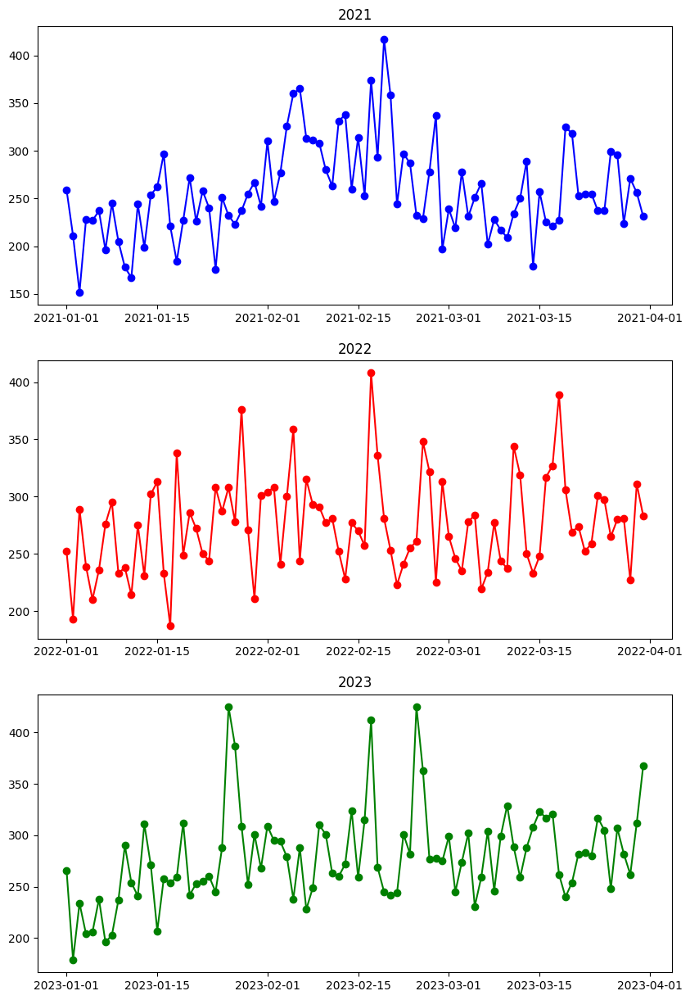

In [61]:
# Group by date and count occurrences
filtered_df_21 = df[(df['crash_date'] >= pd.to_datetime("2021-01-01")) & (df['crash_date'] <= pd.to_datetime("2021-03-31"))]
daily_counts_21 = filtered_df_21['crash_date'].value_counts().sort_index()
filtered_df_22 = df[(df['crash_date'] >= pd.to_datetime("2022-01-01")) & (df['crash_date'] <= pd.to_datetime("2022-03-31"))]
daily_counts_22 = filtered_df_22['crash_date'].value_counts().sort_index()
filtered_df_23 = df[(df['crash_date'] >= pd.to_datetime("2023-01-01")) & (df['crash_date'] <= pd.to_datetime("2023-03-31"))]
daily_counts_23 = filtered_df_23['crash_date'].value_counts().sort_index()

# Plotting
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(10, 15))

axes[0].plot(daily_counts_21.index, daily_counts_21.values, marker='o', linestyle='-', color='b')
axes[0].set_title('2021')
axes[1].plot(daily_counts_22.index, daily_counts_22.values, label='2022', marker='o', linestyle='-', color='r')
axes[1].set_title('2022')
axes[2].plot(daily_counts_23.index, daily_counts_23.values, label='2023', marker='o', linestyle='-', color='g')
axes[2].set_title('2023')
plt.show()


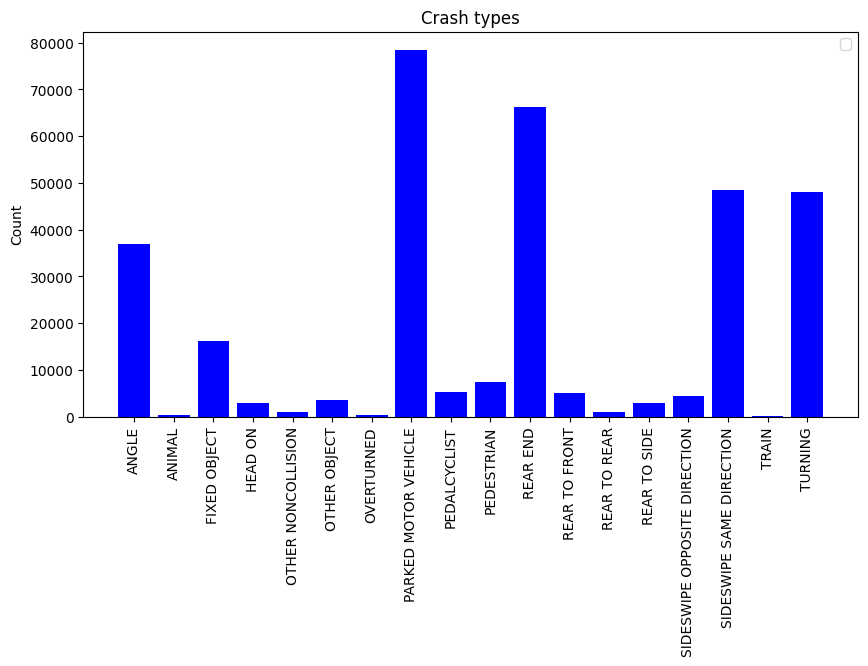

In [62]:
#Plot the crash type
daily_counts = df['first_crash_type'].value_counts().sort_index()

# Plotting
plt.figure(figsize=(10, 5))

plt.bar(daily_counts.index, daily_counts.values, color='b')
plt.title('Crash types')
# plt.xlabel('Condition')
# plt.ylabel('Count')
plt.legend()
plt.xticks(rotation=90)
plt.grid(False)
plt.show()

/var/folders/s6/ds3wsfn57_373wkmyjj6w9kc0000gn/T/ipykernel_49169/2433481948.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['crash_hour'] = pd.to_numeric(df['crash_hour'])


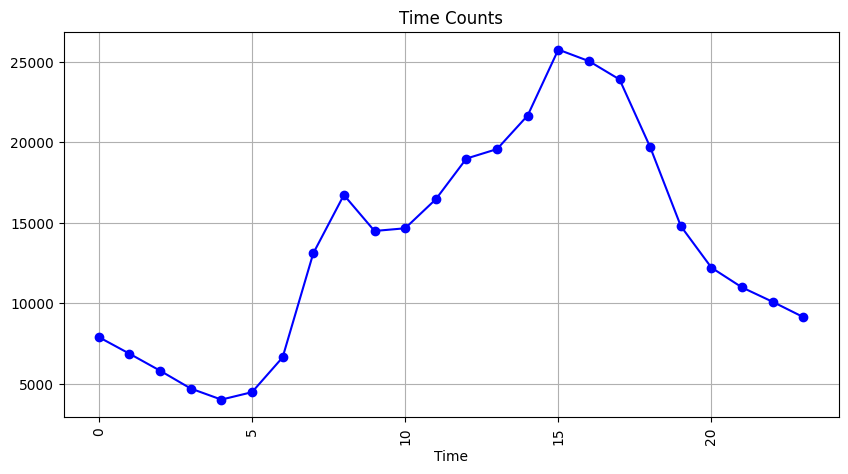

In [63]:
#Plot the number of crashes during the day
df['crash_hour'] = pd.to_numeric(df['crash_hour'])
time_counts = df['crash_hour'].value_counts().sort_index()

# Plotting
plt.figure(figsize=(10, 5))
plt.plot(time_counts.index, time_counts.values, marker='o', linestyle='-', color='b')
plt.title('Time Counts')
plt.xlabel('Time')
# plt.ylabel('Count')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

In [66]:
print(df['weather_condition'].unique())
print(df['work_zone_i'].isna().sum())

['RAIN' 'UNKNOWN' 'CLEAR' 'SNOW' 'CLOUDY/OVERCAST' 'FREEZING RAIN/DRIZZLE'
 'OTHER' 'FOG/SMOKE/HAZE' 'SLEET/HAIL' 'BLOWING SNOW'
 'SEVERE CROSS WIND GATE' 'BLOWING SAND, SOIL, DIRT']
326324


/var/folders/s6/ds3wsfn57_373wkmyjj6w9kc0000gn/T/ipykernel_49169/823896444.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['posted_speed_limit'] = pd.to_numeric(df['posted_speed_limit'])


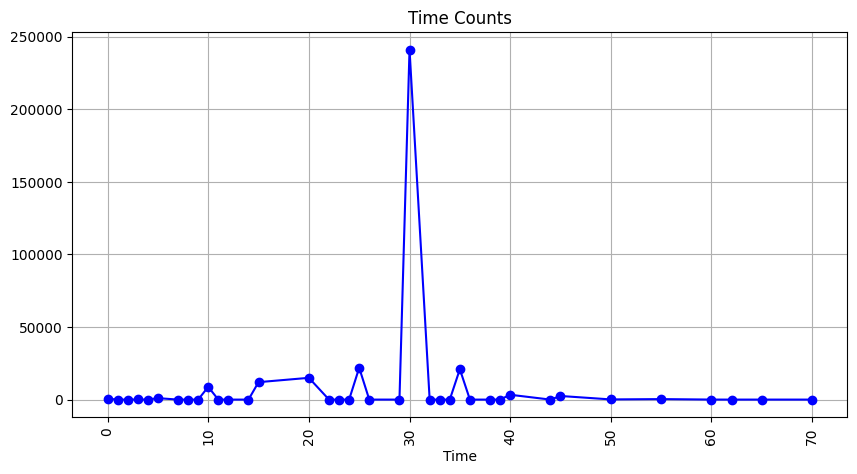

In [71]:

# df['posted_speed_limit'] = pd.to_numeric(df['posted_speed_limit'])
# time_counts = df['posted_speed_limit'].value_counts().sort_index()

# # Plotting
# plt.figure(figsize=(10, 5))
# plt.plot(time_counts.index, time_counts.values, marker='o', linestyle='-', color='b')
# plt.title('Time Counts')
# plt.xlabel('Time')
# # plt.ylabel('Count')
# plt.xticks(rotation=90)
# plt.grid(True)
# plt.show()

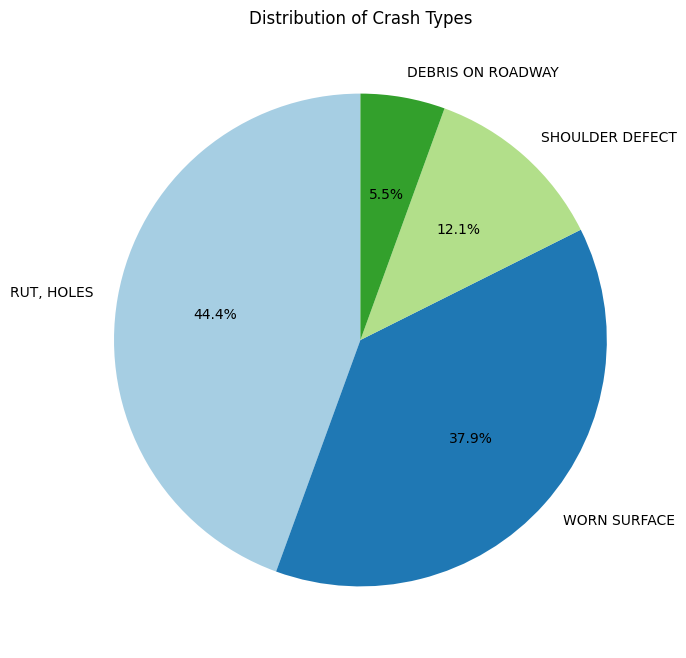

In [90]:
#Plot the crash types based on road condition
cause_counts = df[~df['road_defect'].isin(['NO DEFECTS', 'UNKNOWN', 'OTHER'])]['road_defect'].value_counts()

# Plotting
plt.figure(figsize=(8, 8))
plt.pie(cause_counts, labels=cause_counts.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
plt.title('Distribution of Crash Types')
plt.show()

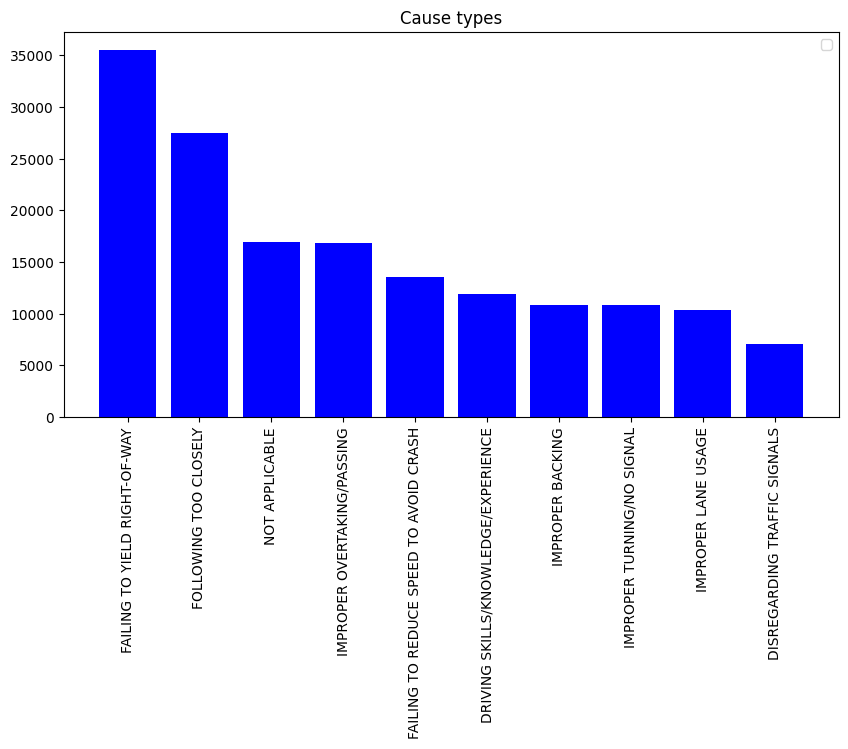

In [76]:
#Plot the car cash causes
daily_counts = df[df['prim_contributory_cause'] != 'UNABLE TO DETERMINE']['prim_contributory_cause'].value_counts().nlargest(10)

# Plotting
plt.figure(figsize=(10, 5))

plt.bar(daily_counts.index, daily_counts.values, color='b')
plt.title('Cause types')
# plt.xlabel('Condition')
# plt.ylabel('Count')
plt.legend()
plt.xticks(rotation=90)
plt.grid(False)
plt.show()

/var/folders/s6/ds3wsfn57_373wkmyjj6w9kc0000gn/T/ipykernel_49169/3542886887.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['crash_day_of_week'] = df['crash_day_of_week'].replace({1: '1-Sun',2: '2-Mon',3: '3-Tue',4: '4-Wed',5: '5-Thur',6: '6-Fri',7: '7-Sat'})


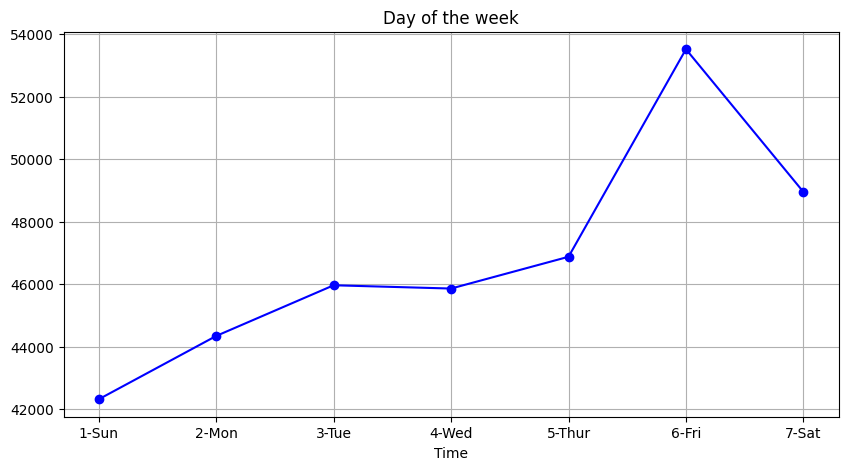

In [100]:
#Plot the cashes during the week
# df['crash_day_of_week'] = pd.to_numeric(df['crash_day_of_week'])
df['crash_day_of_week'] = df['crash_day_of_week'].replace({1: '1-Sun',2: '2-Mon',3: '3-Tue',4: '4-Wed',5: '5-Thur',6: '6-Fri',7: '7-Sat'})
time_counts = df['crash_day_of_week'].value_counts().sort_index()
#Sunday = 1
# Plotting
plt.figure(figsize=(10, 5))
plt.plot(time_counts.index, time_counts.values, marker='o', linestyle='-', color='b')
plt.title('Day of the week')
plt.xlabel('Time')
# plt.ylabel('Count')
plt.xticks(rotation=0)
plt.grid(True)
plt.show()

In [ ]:
print(df['injuries_total'].unique())
print(len(df['street_name'].unique()))

['0' '1' '2' '3' '4' '6' nan '5' '7' '9' '8' '10' '21' '14' '15' '11' '12'
 '17']
1497


/var/folders/s6/ds3wsfn57_373wkmyjj6w9kc0000gn/T/ipykernel_49169/2742218438.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['injuries_fatal'] = pd.to_numeric(df['injuries_fatal'])
/var/folders/s6/ds3wsfn57_373wkmyjj6w9kc0000gn/T/ipykernel_49169/2742218438.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['injuries_fatal'] = df['injuries_fatal'].fillna(0)


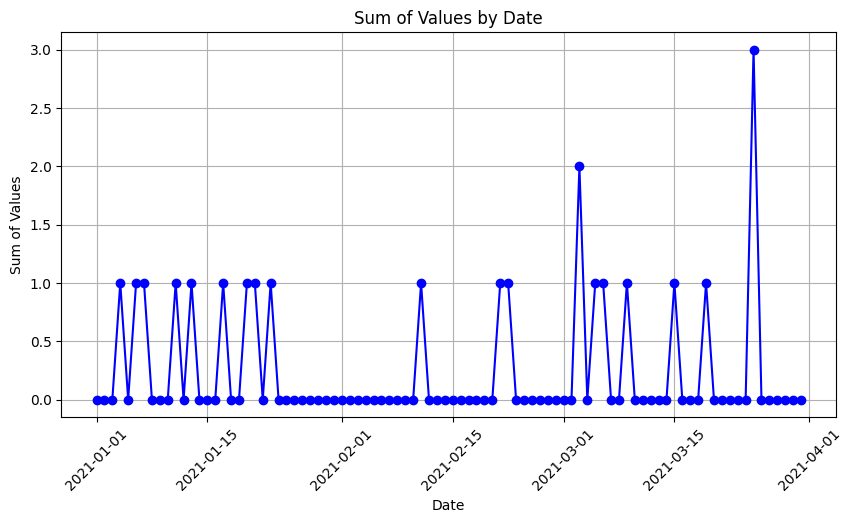

In [ ]:
#Plot fatal injuries
df['injuries_fatal'] = pd.to_numeric(df['injuries_fatal'])
df['injuries_fatal'] = df['injuries_fatal'].fillna(0)
filtered_df_21 = df[(df['crash_date'] >= pd.to_datetime("2021-01-01")) & (df['crash_date'] <= pd.to_datetime("2021-03-31"))]
sum_by_date = filtered_df_21.groupby('crash_date')['injuries_fatal'].sum()

# Plotting a line chart
plt.figure(figsize=(10, 5))
plt.plot(sum_by_date.index, sum_by_date.values, marker='o', linestyle='-', color='b')
plt.title('Sum of Values by Date')
plt.xlabel('Date')
plt.ylabel('Sum of Values')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

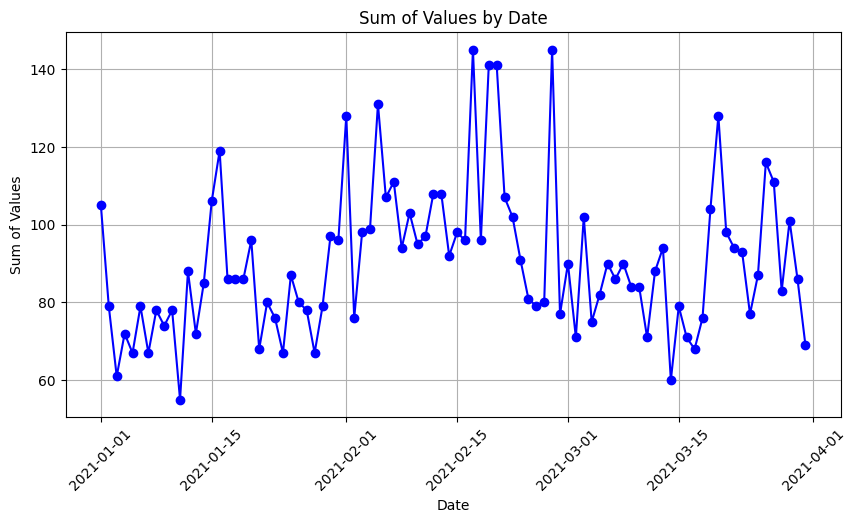

In [ ]:
#Plot hit and run cases
# df['injuries_fatal'] = pd.to_numeric(df['injuries_fatal'])
# df['injuries_fatal'] = df['injuries_fatal'].fillna(0)
filtered_df_21 = df[(df['crash_date'] >= pd.to_datetime("2021-01-01")) & (df['crash_date'] <= pd.to_datetime("2021-03-31"))]
sum_by_date = filtered_df_21[filtered_df_21['hit_and_run_i'] == 'Y'].groupby('crash_date').size()

# Plotting a line chart
plt.figure(figsize=(10, 5))
plt.plot(sum_by_date.index, sum_by_date.values, marker='o', linestyle='-', color='b')
plt.title('Sum of Values by Date')
plt.xlabel('Date')
plt.ylabel('Sum of Values')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

In [125]:
import plotly.graph_objects as go

mapbox_access_token = open(".mapbox_token").read()

fig = go.Figure(go.Scattermapbox(
        lat=df['latitude'],
        lon=df['longitude'],
        mode='markers',
        marker=go.scattermapbox.Marker(
            size=1
        )
    ))

fig.update_layout(
    autosize=True,
    hovermode='closest',
    mapbox=dict(
        accesstoken=mapbox_access_token,
        bearing=0,
        center=dict(
            lat=41.8781,
            lon=-87.6298
        ),
        pitch=0,
        zoom=10
    ),
)

fig.show()

In [ ]:
#Save the cleaned dataframe to csv
df.to_csv('dataset.csv', index=False)